In [ ]:
!pip install chart_studio

In [ ]:
import numpy as np
import pandas as pd
import nltk #NLP library (natural language processing toolkit)
import urllib  
import string
import bs4 as bs  
import re
import heapq
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import datetime as dt
import chart_studio.plotly as py
import plotly.graph_objs as go
import requests
%matplotlib inline
nltk.download('stopwords')
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
#from nltk.stem import SnowballStemmer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
#from string import punctuation
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.linear_model import RidgeClassifier
from gensim.summarization import summarize
from gensim.models import word2vec
#from sklearn.manifold import TSNE
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from nltk.stem.porter import PorterStemmer
from sklearn.model_selection import train_test_split
stop = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
df = pd.read_csv('StateOfUnionData.csv')
df["year"] = df["Date"].apply(lambda x : int(x.split(",")[2])  if len(x.split(","))==3 else int(x.split(",")[1]) )
df.head()

,President,Date,Format,URL,year
0,George Washington,"January 8, 1790",spoken,https://en.wikisource.org/wiki/George_Washingt...,1790
1,George Washington,"December 8, 1790",spoken,https://en.wikisource.org/wiki/George_Washingt...,1790
2,George Washington,"October 25, 1791",spoken,https://en.wikisource.org/wiki/George_Washingt...,1791
3,George Washington,"November 6, 1792",spoken,https://en.wikisource.org/wiki/George_Washingt...,1792
4,George Washington,"December 3, 1793",spoken,https://en.wikisource.org/wiki/George_Washingt...,1793


In [ ]:
df.isnull().any()

President    False
Date         False
Format       False
URL          False
year         False
dtype: bool

In [ ]:
File1 = open("positive_words.txt","r")
File2 = open("negative_words.txt","r")
positive_words = File1.readlines()
negative_words = File2.readlines()
List1=[]
List2=[]
#words_df = pd.DataFrame()
for i in positive_words:
    List1.append(i.rstrip("\n"))
for i in negative_words:
    List2.append(i.rstrip("\n"))
File1.close()
File2.close()

In [ ]:
def cleaning(s):
    s = str(s)
    s = s.lower()
    s = re.sub('\s\W',' ',s)
    s = re.sub('\W,\s',' ',s)
    s = re.sub(r'[^\w]', ' ', s)
    s = re.sub("\d+", "", s)
    s = re.sub('\s+',' ',s)
    s = re.sub('[!@#$_]', '', s)
    s = s.replace("https","")
    s = s.replace(",","")
    s = s.replace("[\w*"," ")
    return s

In [ ]:
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
link=[]
url_list = df['URL']
data_copy=df
sent=[]
sent_n=0
sent_p=0
stemmer = PorterStemmer()
sid = SentimentIntensityAnalyzer()
lemmatizer = WordNetLemmatizer() 
for link in range(0,231):
    count_pos=0
    count_neg=0
    p=0
    f = urllib.request.urlopen(url_list[link])
    myfile = f.read()
    article_html = bs.BeautifulSoup(myfile, 'lxml')
    article_paragraphs = article_html.find_all('p')
    article_text = ''
    for para in article_paragraphs:  
        article_text += para.text
        corpus = nltk.sent_tokenize(article_text)
    for i in range(len(corpus )):
        corpus [i] = cleaning(corpus [i])
        corpus [i] = stemmer.stem(corpus [i])
        corpus [i] = lemmatizer.lemmatize(corpus [i])
    for word in corpus:
        if word in stopwords.words('english'):
            corpus.remove(word) 
    print(corpus,"\n")
    scores = sid.polarity_scores(str(corpus))
    for key in sorted(scores):
        p=p+1
        print('{0}: {1}, '.format(key, scores[key]), end='')
        if p==2:
            sent_n=scores[key]
        if p==3:
            sent_neu=scores[key]
        if p==4:
            sent_p=scores[key]
    for i in corpus:
        i=cleaning(i)
        string=i.split()
        for j in string:
            if j in List1:
                count_pos+=1
            if j in List2:
                count_neg+=1
    if (sent_n>sent_p or count_neg>100):
        sent.append("negative")
    else:
        sent.append("positive")
    print("positive words:",count_pos,"Negative words:",count_neg)
    df['Sentiment']=pd.Series(sent)
#df.to_csv (r'C:\Users\Sreeram\Desktop\export_dataframe.csv', index = False, header=True)

['i embrace with great satisfaction the opportunity which now presents itself of congratulating you on the present favourable prospects of our public affairs ', 'the recent accession of the important state of north carolina to the constitution of the united states of which official information has been received the rising credit and respectability of our country the general and increasing good will towards the government of the union and the concord peace and plenty with which we are blessed are circumstances auspicious in an eminent degree to our national prosperity ', 'in resuming your consultations for the general good you cannot but derive encouragement from the reflection that the measures of the last session have been as satisfactory to your constituents as the novelty and difficulty of the work allowed you to hope ', ' still further to realize their expectations and to secure the blessings which a gracious providence has placed within our reach will in the course of the present 

In [ ]:
def get_text_from_url():
    link=[]
    text=[]
    url_list = df['URL']
    matrix = CountVectorizer(max_features=1000)
    for link in range(0,231):
        f = urllib.request.urlopen(url_list[link])
        myfile = f.read()
        article_html = bs.BeautifulSoup(myfile, 'lxml')
        article_paragraphs = article_html.find_all('p')
        article_text = ''
        for para in article_paragraphs:  
            article_text += para.text
            corpus = nltk.sent_tokenize(article_text)
        for i in range(len(corpus )):
            corpus [i] = cleaning(corpus [i])
            corpus [i] = stemmer.stem(corpus [i])
            corpus [i] = lemmatizer.lemmatize(corpus [i])
        for word in corpus:
            if word in stopwords.words('english'):
                corpus.remove(word) 
        text.append(corpus)
        #print(corpus)
        df['text']=pd.Series(text)
    #return text

In [ ]:
get_text_from_url()

In [ ]:
df

,President,Date,Format,URL,year,Sentiment,text
0,George Washington,"January 8, 1790",spoken,https://en.wikisource.org/wiki/George_Washingt...,1790.0,positive,[i embrace with great satisfaction the opportu...
1,George Washington,"December 8, 1790",spoken,https://en.wikisource.org/wiki/George_Washingt...,1790.0,positive,[fellow citizens of the senate and the house o...
2,George Washington,"October 25, 1791",spoken,https://en.wikisource.org/wiki/George_Washingt...,1791.0,positive,[fellow citizens of the senate and the house o...
3,George Washington,"November 6, 1792",spoken,https://en.wikisource.org/wiki/George_Washingt...,1792.0,positive,[fellow citizens of the senate and of the hous...
4,George Washington,"December 3, 1793",spoken,https://en.wikisource.org/wiki/George_Washingt...,1793.0,positive,[fellow citizens of the senate and of the hous...
...,...,...,...,...,...,...,...
226,Barack Obama,"February 12, 2013",spoken,https://en.wikisource.org/wiki/Barack_Obama%27...,2013.0,positive,[mr speaker mr vice president members of congr...
227,Barack Obama,"January 28, 2014",spoken,https://en.wikisource.org/wiki/Barack_Obama%27...,2014.0,positive,[mr speaker mr vice president members of congr...
228,Barack Obama,"January 20, 2015",spoken,https://en.wikisource.org/wiki/Barack_Obama%27...,2015.0,positive,[mr speaker mr vice president members of congr...
229,Barack Obama,"January 12, 2016",spoken,https://en.wikisource.org/wiki/Barack_Obama%27...,2016.0,positive,[mr speaker mr vice president members of congr...


In [ ]:
df.to_csv ('newdata.csv', index = False, header=True)

In [ ]:
df=pd.read_csv('newdata.csv')

In [ ]:
df

,President,Date,Format,URL,year,Sentiment,text
0,George Washington,"January 8, 1790",spoken,https://en.wikisource.org/wiki/George_Washingt...,1790.0,positive,['i embrace with great satisfaction the opport...
1,George Washington,"December 8, 1790",spoken,https://en.wikisource.org/wiki/George_Washingt...,1790.0,positive,['fellow citizens of the senate and the house ...
2,George Washington,"October 25, 1791",spoken,https://en.wikisource.org/wiki/George_Washingt...,1791.0,positive,['fellow citizens of the senate and the house ...
3,George Washington,"November 6, 1792",spoken,https://en.wikisource.org/wiki/George_Washingt...,1792.0,positive,['fellow citizens of the senate and of the hou...
4,George Washington,"December 3, 1793",spoken,https://en.wikisource.org/wiki/George_Washingt...,1793.0,positive,['fellow citizens of the senate and of the hou...
...,...,...,...,...,...,...,...
226,Barack Obama,"February 12, 2013",spoken,https://en.wikisource.org/wiki/Barack_Obama%27...,2013.0,positive,['mr speaker mr vice president members of cong...
227,Barack Obama,"January 28, 2014",spoken,https://en.wikisource.org/wiki/Barack_Obama%27...,2014.0,positive,['mr speaker mr vice president members of cong...
228,Barack Obama,"January 20, 2015",spoken,https://en.wikisource.org/wiki/Barack_Obama%27...,2015.0,positive,['mr speaker mr vice president members of cong...
229,Barack Obama,"January 12, 2016",spoken,https://en.wikisource.org/wiki/Barack_Obama%27...,2016.0,positive,['mr speaker mr vice president members of cong...


In [ ]:
# creating the feature matrix
from keras.preprocessing.text import Tokenizer
tokenizer = Tokenizer()
c=0
#matrix = CountVectorizer(max_features=1500, min_df=5, max_df=0.7, stop_words=stopwords.words('english'))
for i in df['text']:
    c=c+1
    tokenizer.fit_on_texts(i)
    X = tokenizer.texts_to_matrix(i, mode='count')
#print(c)
#X = matrix.fit_transform(df['text']).toarray()

Using TensorFlow backend.


In [ ]:
X

In [ ]:
tfidfconverter = TfidfTransformer()
X = tfidfconverter.fit_transform(X).toarray()

In [ ]:
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from matplotlib import pyplot
from numpy import where
# define dataset
X, y = make_classification(n_samples=10000, n_features=2, n_redundant=0,
	n_clusters_per_class=1, weights=[0.99], flip_y=0, random_state=1)
# summarize class distribution
counter = Counter(y)
print(counter)
# transform the dataset
oversample = SMOTE()
X, y = oversample.fit_resample(X, y)
# summarize the new class distribution
counter = Counter(y)
print(counter)

Counter({0: 9900, 1: 100})
Counter({0: 9900, 1: 9900})


/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.



In [ ]:
#y = df.iloc[:, 5]
# split train and test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3, random_state=1)

In [ ]:
from sklearn.naive_bayes import MultinomialNB
classifier = GaussianNB()
classifier.fit(X_train, y_train)

# Predict Class
y_pred = classifier.predict(X_test)

# Accuracy 
accuracy_NB = accuracy_score(y_test, y_pred)
print(accuracy_NB)

0.8558922558922559


In [ ]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier()
classifier.fit(X_train, y_train)

# Predict Class
y_pred = classifier.predict(X_test)

# Accuracy 
accuracy_RF = accuracy_score(y_test, y_pred)
print(accuracy_RF)

0.9473063973063973


In [ ]:
from sklearn.ensemble import AdaBoostClassifier as ABC
classifier = ABC()
classifier.fit(X_train, y_train)

# Predict Class
y_pred = classifier.predict(X_test)

# Accuracy 
accuracy_ABC = accuracy_score(y_test, y_pred)
print(accuracy_ABC)


0.9021885521885522


In [ ]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

results = confusion_matrix(y_test, y_pred) 
  
print('Confusion Matrix :')
print(results) 
print('Report : ')
print(classification_report(y_test, y_pred)) 
print(accuracy_score(y_test, y_pred)*100)

Confusion Matrix :
[[2715  297]
 [ 284 2644]]
Report : 
              precision    recall  f1-score   support

           0       0.91      0.90      0.90      3012
           1       0.90      0.90      0.90      2928

    accuracy                           0.90      5940
   macro avg       0.90      0.90      0.90      5940
weighted avg       0.90      0.90      0.90      5940

90.21885521885523


In [ ]:
def plot_roc_curve(fper, tper):  
    plt.plot(fper, tper, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

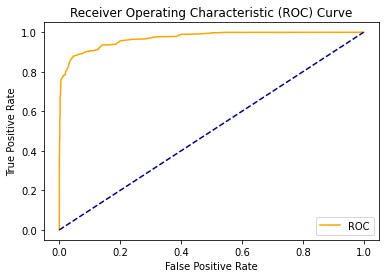

In [ ]:
probs = classifier.predict_proba(X_test)  
probs = probs[:, 1]  
fper, tper, thresholds = roc_curve(y_test, probs) 
plot_roc_curve(fper, tper)

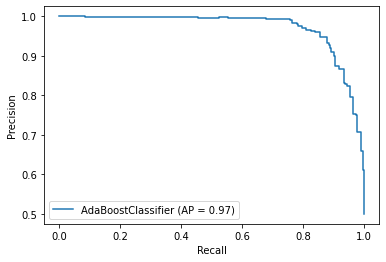

In [ ]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import plot_precision_recall_curve
from sklearn.metrics import average_precision_score

disp = plot_precision_recall_curve(classifier, X_test, y_test)

In [ ]:
wordfreq = {}
link=[]
url_list = df['URL']
for link in range(0,231):
    f = urllib.request.urlopen(url_list[link])
    myfile = f.read()
    article_html = bs.BeautifulSoup(myfile, 'lxml')
    article_paragraphs = article_html.find_all('p')
    article_text = ''
    for para in article_paragraphs:  
            article_text += para.text
            corpus = nltk.sent_tokenize(article_text)
    for i in range(len(corpus )):
        corpus [i] = cleaning(corpus [i])
        corpus[i] = stemmer.stem(corpus [i])
        corpus [i] = lemmatizer.lemmatize(corpus [i])
    for word in corpus:
        if word in stopwords.words('english'):
            corpus.remove(word)
    for sentence in corpus: 
        tokens = nltk.word_tokenize(sentence)
        for token in tokens:
        #if token in 
            if token not in wordfreq.keys():
                wordfreq[token] = 1
            else:
                wordfreq[token] += 1
    most_freq = heapq.nlargest(200, wordfreq, key=wordfreq.get)

In [ ]:
wordfreq

In [ ]:
most_freq

In [ ]:
df.groupby('Sentiment').describe()
# The dataframe is imbalanced.

In [ ]:
df.columns

In [ ]:
df

# Data Analysis

In [ ]:
Presidents =df.groupby(['President']).size()
Presidents.plot(kind="bar",ecolor='r', align='center')
#shows the number of state union addresses given by each president

In [ ]:
President_Name = df['President']
Date = df['Date']

In [ ]:
Speech_Date=df.groupby(['President','Date']).size()
Speech_Date

In [ ]:
link=[]
total_words=[]
unique=[]
uratio=[]
for link in range(0,231):
    word_count=0
    unique_word_count=0
    unique_word_ratio=0
    f = urllib.request.urlopen(url_list[link])
    myfile = f.read()
    article_html = bs.BeautifulSoup(myfile, 'lxml')
    article_paragraphs = article_html.find_all('p')
    article_text = ''
    for para in article_paragraphs:  
        article_text += para.text
        article_text = cleaning(article_text)
        article_text = stemmer.stem(article_text)
        article_text = lemmatizer.lemmatize(article_text)
    word_count+=len(article_text.split())
    unique_word_count+=len(set(article_text.lower().split()))
    unique.append(unique_word_count)
    unique_word_ratio=unique_word_count/word_count
    uratio.append(unique_word_ratio)
    total_words.append(word_count)
df['unique word ratio'] = pd.Series(uratio)
df['unique words'] = pd.Series(unique)
df['words'] = pd.Series(total_words)

In [ ]:
df

In [ ]:
df.to_csv (r'C:\Users\Sreeram\Desktop\result.csv', index = False, header=True)

In [ ]:
for i in range(len(df)):
    print('\nPresident Name',df['President'][i],'\nNo of words',df['words'][i],'\nDate',df['Date'][i])

In [ ]:
party_dict = {
    "Federalist":["George Washington","John Adams"],
    "Democratic-Republican":['Thomas Jefferson',
       'James Madison', 'James Monroe', 'John Quincy Adams'],
    "Democrat":['Andrew Johnson','Andrew Jackson', 'Martin Van Buren',
                'James K Polk','Franklin Pierce',
                'James Buchanan','Grover Cleveland',
               'Woodrow Wilson','Franklin D Roosevelt',
       'Harry S Truman','John F Kennedy',
       'Lyndon B Johnson','Jimmy Carter',
                'Bill Clinton', 'Barack Obama'
               ],
    "Whig":["William Henry Harrison",'Zachary Taylor','Millard Fillmore','John Tyler'],
    "Republican":['Abraham Lincoln', 'Ulysses S Grant',
       'Rutherford B Hayes', 'James A. Garfield','Benjamin Harrison', 'William McKinley', 'Theodore Roosevelt',
       'William Howard Taft','Warren G Harding',
       'Calvin Coolidge', 'Herbert Hoover','Chester Arthur',
                  'Dwight D Eisenhower',
                  'Richard Nixon','Gerald R Ford',
                  'Ronald Reagan', 'George HW Bush',
                  'George W Bush','Donald Trump'
                 ]
    
}

In [ ]:
def get_party(name):
    for party,names in party_dict.items():
        if name in names:
            return party
df["party"] = df["President"].apply(lambda x : get_party(x))
g= sns.countplot(y="party",data=df,)
plt.title("Number of Speeches per Political Party")

In [ ]:
df.to_csv (r'C:\Users\Sreeram\Desktop\result.csv', index = False, header=True)

In [ ]:
ax= sns.boxplot(df["words"],orient='v')
plt.title("Box plot of Word Count")
'''It show that 50% of the speeches has 4800 to 10000 words. We could also notice some outliers'''

In [ ]:
print("Average number of words per speech : ",df["words"].mean())
print()
print("Smallest Speech : ")
print(df.iloc[df["words"].idxmin(axis=1)])
print()
print("Longest Speech : ")
print(df.iloc[df["words"].idxmax(axis=1)])

In [ ]:
wc_mean = df.groupby("party")["words"].mean().reset_index()
g =sns.catplot(x="party",y="words",kind="bar",data=wc_mean)
g.set_xticklabels(rotation=90)

In [ ]:
df.groupby('party').size()

In [ ]:
# Making the data frame 'text' into a pandas series for wordcloud
link=[]
url_list = df['URL']
for link in range(0,1):
    f = urllib.request.urlopen(url_list[link])
    myfile = f.read()
    article_html = bs.BeautifulSoup(myfile, 'lxml')
    article_paragraphs = article_html.find_all('p')
    article_text = ''
    for para in article_paragraphs:  
        article_text += para.text
        corpus = nltk.sent_tokenize(article_text)
    i=cleaning(corpus)
    texts = pd.Series(i).astype(str)
# Building a wordcloud!
    cloud = WordCloud(
                         width=900,
                         height=800,
                         min_font_size=0.1,
                         background_color='black',
                         colormap='plasma'
                         ).generate(''.join(texts))

    plt.figure(figsize=(20, 15))
    plt.imshow(cloud)
    plt.axis('off')     

In [ ]:
df_party = df[df.party.isin(['Republican', 'Democrat'])]

In [ ]:
'''Note that the political parties are not well balanced, the Democrats and Republicans accounnt for 183 out of 231 addresses, 
while the other three parties made up only 20%. Therefore, it might be more interesting to predict the probability that a given text belongs to a particular political party, eg. 62% Demo'''

In [ ]:
link=[]
sentence_lengths=[]
url_list = df['URL']
for link in range(0,231):
    s=0
    f = urllib.request.urlopen(url_list[link])
    myfile = f.read()
    article_html = bs.BeautifulSoup(myfile, 'lxml')
    article_paragraphs = article_html.find_all('p')
    article_text = ''
    for para in article_paragraphs:  
        article_text += para.text
        corpus = nltk.sent_tokenize(article_text)
    sentences = [nltk.sent_tokenize(text) for text in corpus]
    for sent in sentences:
        s = s+len(sent)
    sentence_lengths.append(s)
    df_party['sentence_length'] = pd.Series(sentence_lengths)
# now need to "unstack" the above list of lists of sentences
    sentences_all = []
    for sentences in sentences:
        for sent in sentences:
            sentences_all.append(sent)

In [ ]:
df_party

In [ ]:
plt.figure(figsize=(10,6))
sns.lineplot(x='year',y='sentence_length',hue='party',data=df_party.reset_index())
plt.xlabel('')
plt.ylabel('Number of Sentences')
sns.despine()
plt.show()